In [1]:
import cv2
import numpy as np
from superpoint.datasets.colon import Colon
from utils import plot_imgs

%load_ext autoreload
%autoreload 2
%matplotlib inline

/home/student/anaconda3/envs/colon_superpoint_tf13/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:526: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/student/anaconda3/envs/colon_superpoint_tf13/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:527: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/student/anaconda3/envs/colon_superpoint_tf13/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:528: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)]

# Colon Train - Warped image pairs used when training SuperPoint

In [ ]:
config = {
    'labels': 'outputs/baseline_seq_001_002_labels_tf13',
    'truncate': 50,
    'augmentation' : {
        'photometric': {
            'enable': True,
            'primitives': [
                'random_brightness', 'random_contrast', 'additive_speckle_noise',
                'additive_gaussian_noise', 'additive_shade', 'motion_blur'],
            'params': {
                'random_brightness': {'max_abs_change': 50},
                'random_contrast': {'strength_range': [0.5, 1.5]},
                'additive_gaussian_noise': {'stddev_range': [0, 10]},
                'additive_speckle_noise': {'prob_range': [0, 0.0035]},
                'additive_shade': {'transparency_range': [-.5, .5], 'kernel_size_range': [100, 150]},
                'motion_blur': {'max_kernel_size': 3},
            }
        },
    },
    'warped_pair': {
        'enable': True,
        'params': {
            'translation': True,
            'rotation': True,
            'scaling': True,
            'perspective': True,
            'scaling_amplitude': 0.2,
            'perspective_amplitude_x': 0.2,
            'perspective_amplitude_y': 0.2,
            'patch_ratio': 0.85,
            'max_angle': 1.57,
            'allow_artifacts': True,
        },
        'valid_border_margin': 3,
    },
}
dataset = Colon(**config)
data = dataset.get_training_set()
add_keypoints = True


--Return--
None
> <ipython-input-2-d2b8b6c918fe>(37)<module>()
     35     },
     36 }
---> 37 import pdb; pdb.set_trace()
     38 dataset = Colon(**config)
     39 data = dataset.get_training_set()

      1 config = {
      2     'labels': 'outputs/baseline_seq_001_002_labels_tf13',
      3     'truncate': 50,
      4     'augmentation' : {
      5         'photometric': {
      6             'enable': True,
      7             'primitives': [
      8                 'random_brightness', 'random_contrast', 'additive_speckle_noise',
      9                 'additive_gaussian_noise', 'additive_shade', 'motion_blur'],
     10             'params': {
     11                 'random_brightness': {'max_abs_change': 50},
     12                 'random_contrast': {'strength_range': [0.5, 1.5]},
     13                 'additive_gaussian_noise': {'stddev_range': [0, 10]},
     14                 'additive_speckle_noise': {'prob_range': [0, 0.0035]},
     15                 'additive_shade': 

In [10]:
def draw_keypoints(img, corners, color=(0, 255, 0), radius=3, s=3):
    img = np.repeat(cv2.resize(img, None, fx=s, fy=s)[..., np.newaxis], 3, -1)
    for c in np.stack(corners).T:
        cv2.circle(img, tuple(s*np.flip(c, 0)), radius, color, thickness=-1)
    return img
def draw_overlay(img, mask, color=[0, 0, 255], op=0.5, s=3):
    mask = cv2.resize(mask.astype(np.uint8), None, fx=s, fy=s, interpolation=cv2.INTER_NEAREST)
    img[np.where(mask)] = img[np.where(mask)]*(1-op) + np.array(color)*op
def display(d):
    img = draw_keypoints(d['image'][..., 0] * 255, np.where(d['keypoint_map']), (0, 255, 0)) if add_keypoints \
            else d['image'][..., 0] * 255
    draw_overlay(img, np.logical_not(d['valid_mask']))
    return img

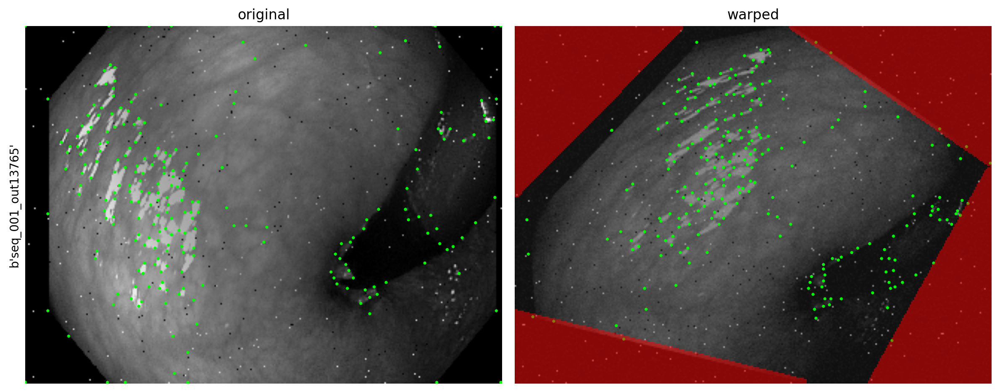

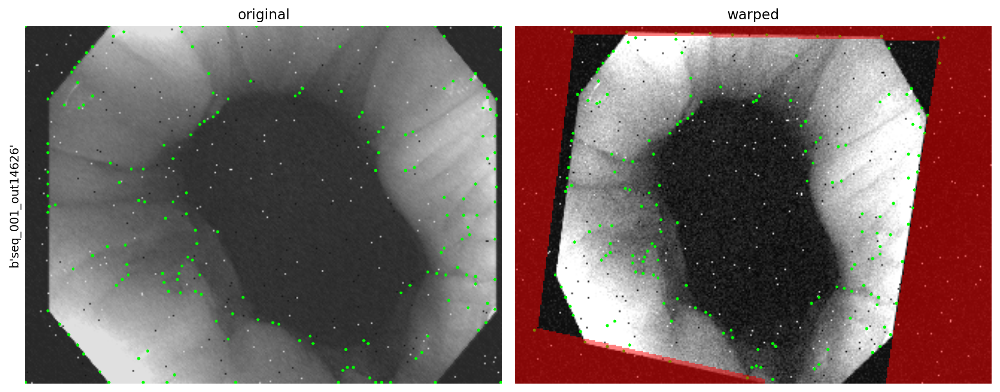

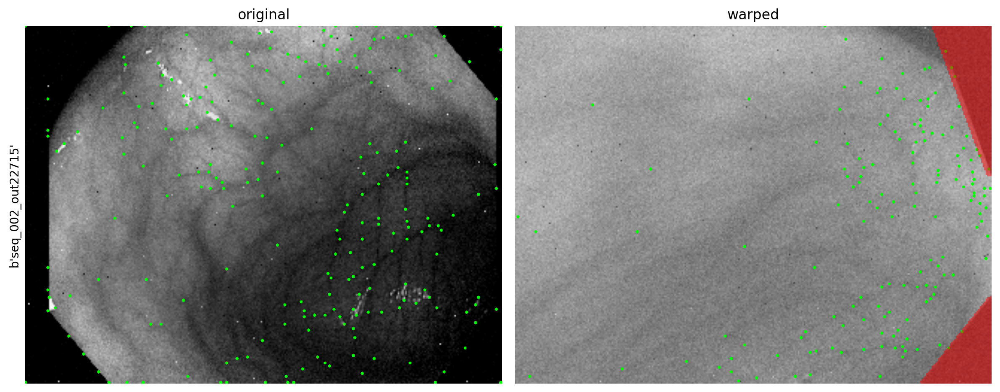

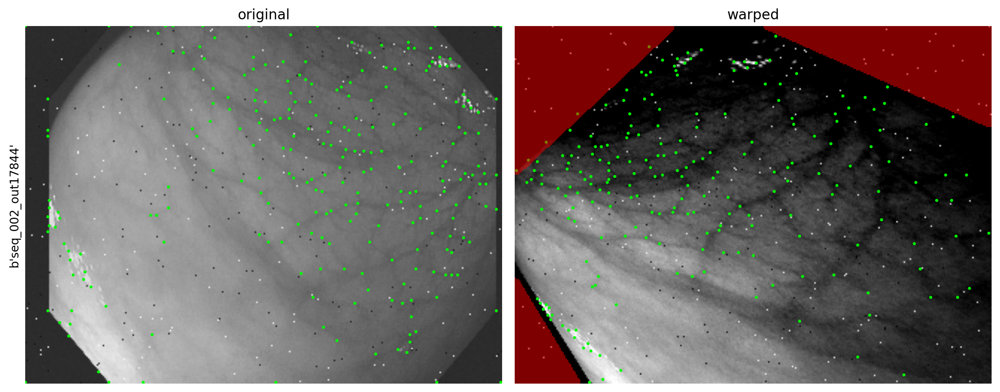

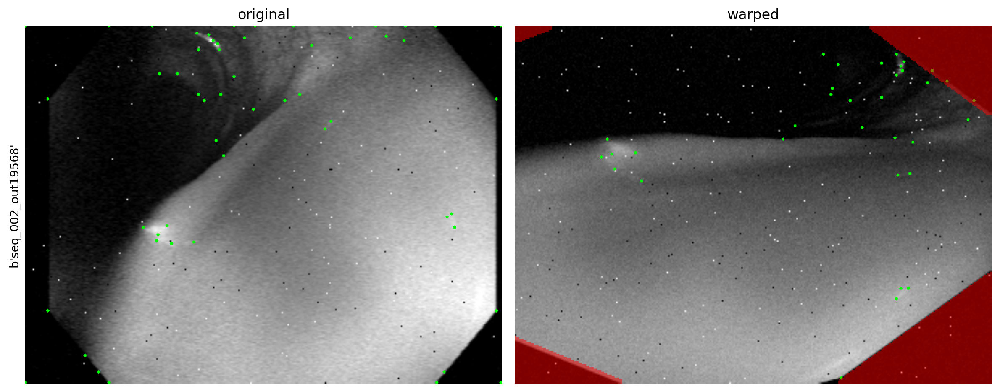

...

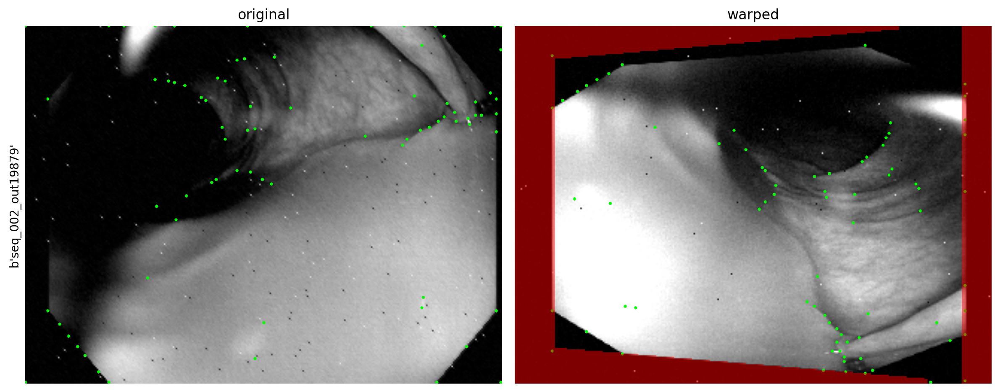

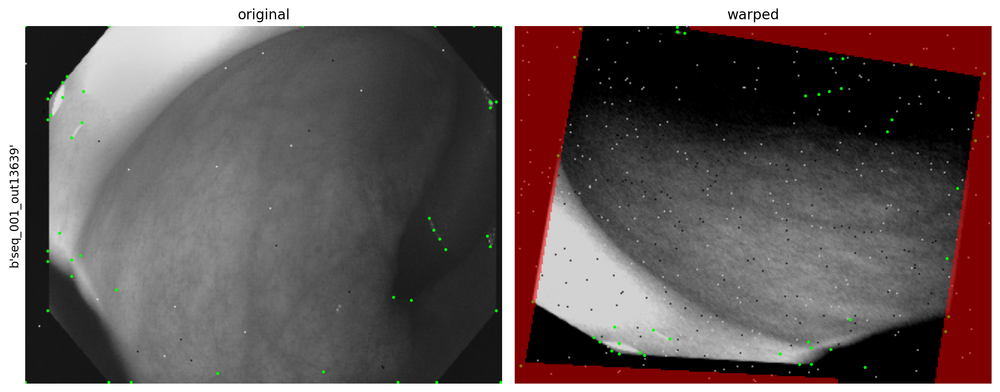

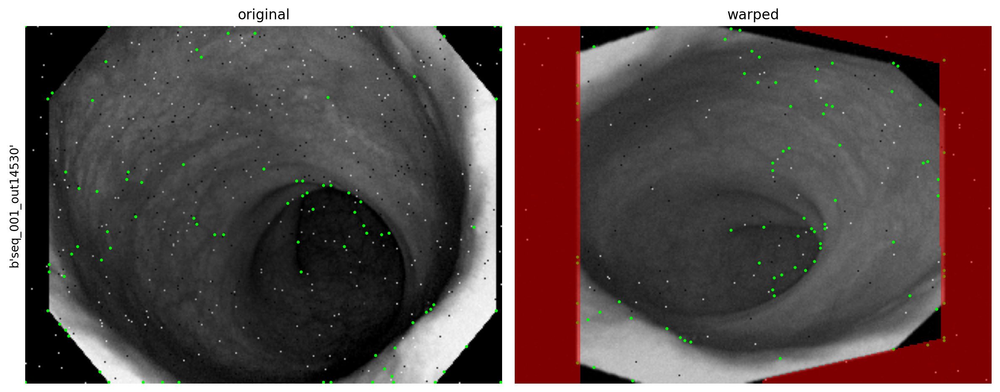

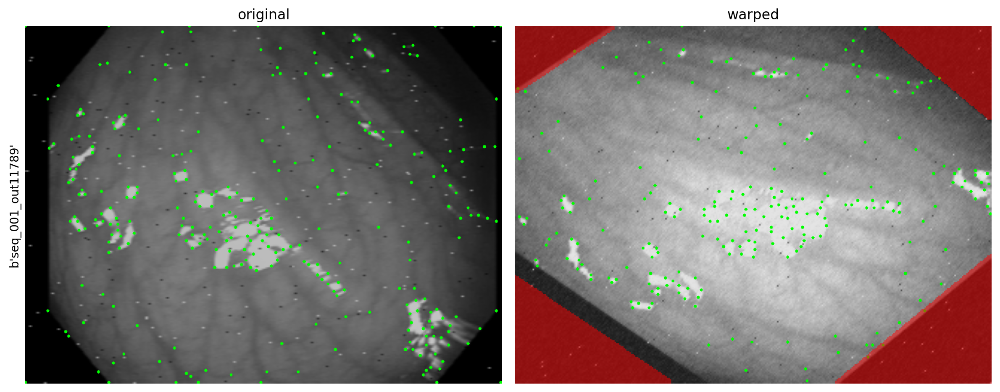

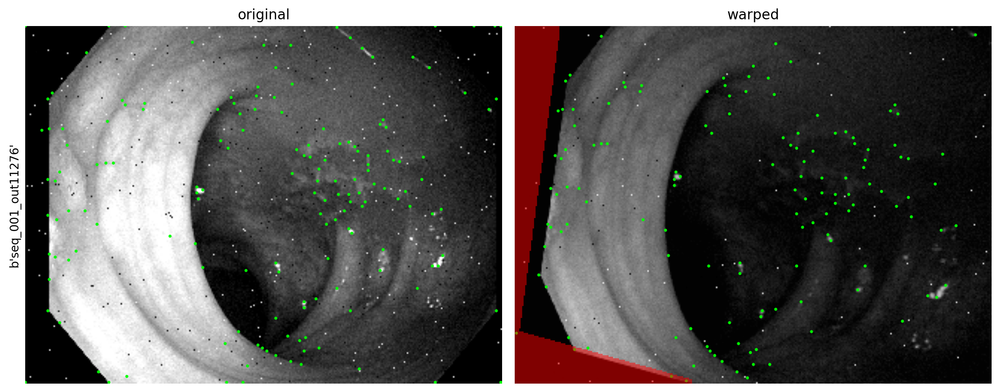

In [11]:
for i in range(15):
    d = next(data)
    plot_imgs([display(d)/255., display(d['warped'])/255.], ylabel=d['name'], 
              titles=['original', 'warped'], dpi=200, cmap='gray')